# Global Analysis - Covid19 

### Importing modules

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt 
print('modules are imported')

modules are imported


### Loading the Dataset

In [2]:
dataset = 'https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv'
df = pd.read_csv(dataset)

### Dataframe Check

In [3]:
df.head()

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-23,Afghanistan,0,0,0
2,2020-01-24,Afghanistan,0,0,0
3,2020-01-25,Afghanistan,0,0,0
4,2020-01-26,Afghanistan,0,0,0


In [4]:
df = df.sort_values(by="Date")
df.head()

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
36018,2020-01-22,Qatar,0,0,0
4959,2020-01-22,Bhutan,0,0,0
36279,2020-01-22,Romania,0,0,0
36540,2020-01-22,Russia,0,0,0


In [5]:
df.tail()

,Date,Country,Confirmed,Recovered,Deaths
31580,2020-10-08,Namibia,11781,9759,127
31319,2020-10-08,Mozambique,9639,6911,68
31058,2020-10-08,Morocco,142953,120275,2486
33407,2020-10-08,North Macedonia,19777,15855,775
49067,2020-10-08,Zimbabwe,7951,6446,229


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49068 entries, 0 to 49067
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Date       49068 non-null  object
 1   Country    49068 non-null  object
 2   Confirmed  49068 non-null  int64 
 3   Recovered  49068 non-null  int64 
 4   Deaths     49068 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 2.2+ MB


### Dataframe Shape Check 

In [7]:
df.shape

(49068, 5)

### Preprocessing 

In [8]:
df = df[df.Confirmed > 0]
df.head()

,Date,Country,Confirmed,Recovered,Deaths
45414,2020-01-22,US,1,0,0
43065,2020-01-22,Taiwan*,1,0,0
43848,2020-01-22,Thailand,2,0,0
22707,2020-01-22,Japan,2,0,0
23751,2020-01-22,"Korea, South",1,0,0


In [9]:
df[df.Country== 'China'].head()

,Date,Country,Confirmed,Recovered,Deaths
9396,2020-01-22,China,548,28,17
9397,2020-01-23,China,643,30,18
9398,2020-01-24,China,920,36,26
9399,2020-01-25,China,1406,39,42
9400,2020-01-26,China,2075,49,56


In [10]:
df[df.Country== 'China'].iloc[0:5,:]

,Date,Country,Confirmed,Recovered,Deaths
9396,2020-01-22,China,548,28,17
9397,2020-01-23,China,643,30,18
9398,2020-01-24,China,920,36,26
9399,2020-01-25,China,1406,39,42
9400,2020-01-26,China,2075,49,56


## Inspecting data related to Italy 


In [11]:
df[df.Country == 'Italy']

,Date,Country,Confirmed,Recovered,Deaths
22194,2020-01-31,Italy,2,0,0
22195,2020-02-01,Italy,2,0,0
22196,2020-02-02,Italy,2,0,0
22197,2020-02-03,Italy,2,0,0
22198,2020-02-04,Italy,2,0,0
...,...,...,...,...,...
22441,2020-10-04,Italy,325329,231914,35986
22442,2020-10-05,Italy,327586,232681,36002
22443,2020-10-06,Italy,330263,234099,36030
22444,2020-10-07,Italy,333940,235303,36061


## Global spread of Covid19

In [12]:
fig = px.choropleth(df, locations = 'Country', locationmode= 'country names', 
                    color= 'Confirmed',
                   animation_frame='Date')
fig.update_layout(title_text = 'Global Spread of Corona Virus')
fig.show()

## Global deaths of Covid19

In [13]:
fig = px.choropleth(df, locations = 'Country', locationmode= 'country names', 
                    color= 'Deaths',
                   animation_frame='Date')
fig.update_layout(title_text = 'Global Deaths from Corona Virus')
fig.show()

## Visualizing the intensity of Covid19 Transmission in India

In [14]:
df_India = df[df.Country == 'India']
print(df_India)

             Date Country  Confirmed  Recovered  Deaths
20627  2020-01-30   India          1          0       0
20628  2020-01-31   India          1          0       0
20629  2020-02-01   India          1          0       0
20630  2020-02-02   India          2          0       0
20631  2020-02-03   India          3          0       0
...           ...     ...        ...        ...     ...
20875  2020-10-04   India    6623815    5586703  102685
20876  2020-10-05   India    6685082    5662490  103569
20877  2020-10-06   India    6757131    5744693  104555
20878  2020-10-07   India    6835655    5827704  105526
20879  2020-10-08   India    6835655    5827704  105526

[253 rows x 5 columns]


In [15]:
df_India = df_India.loc[:,('Date','Confirmed')]

In [16]:
df_India.head()

,Date,Confirmed
20627,2020-01-30,1
20628,2020-01-31,1
20629,2020-02-01,1
20630,2020-02-02,2
20631,2020-02-03,3


##### first derivation of confrimed column

In [17]:
df_India['New_cases'] = df_India['Confirmed'].diff()
df_India[0:10]

,Date,Confirmed,New_cases
20627,2020-01-30,1,NaN
20628,2020-01-31,1,0.0
20629,2020-02-01,1,0.0
20630,2020-02-02,2,1.0
20631,2020-02-03,3,1.0
20632,2020-02-04,3,0.0
20633,2020-02-05,3,0.0
20634,2020-02-06,3,0.0
20635,2020-02-07,3,0.0
20636,2020-02-08,3,0.0


In [18]:
px.line(df_India, x= 'Date', y= ['Confirmed', 'New_cases'])

## Visualizing month wise new infection using ```matplotlib```

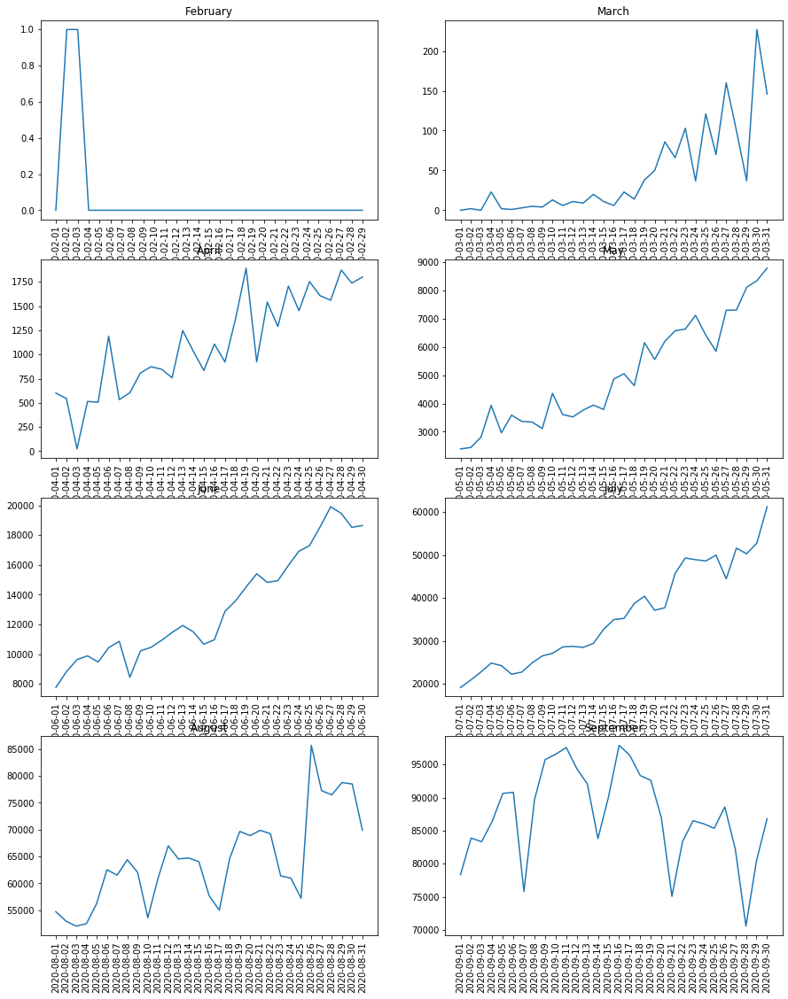

In [19]:
f, axs = plt.subplots(4,2,figsize=(15,19))

# fig = plt.figure()

plt.subplot(4, 2, 1)
plt.plot(df_India['Date'][2:31], df_India['New_cases'][2:31])
plt.title("February") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 2)
plt.plot(df_India['Date'][31:62], df_India['New_cases'][31:62])
plt.title("March") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 3)
plt.plot(df_India['Date'][62:92], df_India['New_cases'][62:92])
plt.title("April") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 4)
plt.plot(df_India['Date'][92:123], df_India['New_cases'][92:123])
plt.title("May") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 5)
plt.plot(df_India['Date'][123:153], df_India['New_cases'][123:153])
plt.title("June") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 6)
plt.plot(df_India['Date'][153:184], df_India['New_cases'][153:184])
plt.title("July") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 7)
plt.plot(df_India['Date'][184:215], df_India['New_cases'][184:215])
plt.title("August") 
plt.xticks(rotation = 90)

plt.subplot(4, 2, 8)
plt.plot(df_India['Date'][215:245], df_India['New_cases'][215:245])
plt.title("September") 
plt.xticks(rotation = 90)

plt.show()

## Visualizing month wise new infection using ```plotly```

In [20]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=2, cols=4,
    subplot_titles=("February", "March", "April", "May", "June", "July", "August", "September"))

fig.add_trace(go.Scatter(x=df_India['Date'][2:31], y=df_India['New_cases'][2:31]),
              row=1, col=1)

fig.add_trace(go.Scatter(x=df_India['Date'][31:62], y=df_India['New_cases'][31:62]),
              row=1, col=2)

fig.add_trace(go.Scatter(x=df_India['Date'][62:92], y=df_India['New_cases'][62:92]),
              row=1, col=3)

fig.add_trace(go.Scatter(x=df_India['Date'][92:123], y=df_India['New_cases'][92:123]),
              row=1, col=4)

fig.add_trace(go.Scatter(x=df_India['Date'][123:153], y=df_India['New_cases'][123:153]),
              row=2, col=1)

fig.add_trace(go.Scatter(x=df_India['Date'][153:184], y=df_India['New_cases'][153:184]),
              row=2, col=2)

fig.add_trace(go.Scatter(x=df_India['Date'][184:215], y=df_India['New_cases'][184:215]),
              row=2, col=3)

fig.add_trace(go.Scatter(x=df_India['Date'][215:245], y=df_India['New_cases'][215:245]),
              row=2, col=4)

fig.update_layout(height=500, width=700, showlegend=False,
                  title_text="Multiple Subplots with Titles")

fig.show()

In [21]:
df_India['Date'][0:10]

20627    2020-01-30
20628    2020-01-31
20629    2020-02-01
20630    2020-02-02
20631    2020-02-03
20632    2020-02-04
20633    2020-02-05
20634    2020-02-06
20635    2020-02-07
20636    2020-02-08
Name: Date, dtype: object

## India's maximum infection on a single day

In [22]:
#df_India['New_cases'].max()
g = df_India.sort_values('New_cases',ascending = False)
g[['Date', 'New_cases']].head(1)

,Date,New_cases
20857,2020-09-16,97894.0


## Calculating Maximum Infection Rate(MIR) for all of the countries

In [23]:
df.head()

,Date,Country,Confirmed,Recovered,Deaths
45414,2020-01-22,US,1,0,0
43065,2020-01-22,Taiwan*,1,0,0
43848,2020-01-22,Thailand,2,0,0
22707,2020-01-22,Japan,2,0,0
23751,2020-01-22,"Korea, South",1,0,0


In [24]:
countries = list(df.Country.unique())
max_infection_rates = []
for c in countries: 
    MIR = df[df.Country==c].Confirmed.diff().max()
    max_infection_rates.append(MIR)

### MIR new Dataframe 

In [25]:
df_MIR = pd.DataFrame()
df_MIR['Country'] = countries
df_MIR['Max_Infection_Rate'] = max_infection_rates
df_MIR.head()

,Country,Max_Infection_Rate
0,US,77362.0
1,Taiwan*,27.0
2,Thailand,188.0
3,Japan,1762.0
4,"Korea, South",851.0


### Barchart : maximum infection rate of each country

In [26]:
px.bar(df_MIR, x='Country', y='Max_Infection_Rate', color='Country', title='Global Maximum Infection Rate', log_y=True)

## Inspecting the impact of Covid19 National Lockdown in Italy

### COVID19 pandemic lockdown in Italy 
On 9 March 2020, the government of Italy under Prime Minister Giuseppe Conte imposed a national quarantine, restricting the movement of the population except for necessity, work, and health circumstances, in response to the growing pandemic of COVID-19 in the country. <a href="https://en.wikipedia.org/wiki/COVID-19_pandemic_lockdown_in_Italy#:~:text=On%209%20March%202020%2C%20the,COVID%2D19%20in%20the%20country.">source</a>

In [27]:
italy_lockdown_start_date = '2020-03-09'
italy_lockdown_a_month_later = '2020-04-09'

In [28]:
df.head()

,Date,Country,Confirmed,Recovered,Deaths
45414,2020-01-22,US,1,0,0
43065,2020-01-22,Taiwan*,1,0,0
43848,2020-01-22,Thailand,2,0,0
22707,2020-01-22,Japan,2,0,0
23751,2020-01-22,"Korea, South",1,0,0


In [29]:
df_italy = df[df.Country=='Italy']

### Dataframe Check

In [30]:
df_italy.head()

,Date,Country,Confirmed,Recovered,Deaths
22194,2020-01-31,Italy,2,0,0
22195,2020-02-01,Italy,2,0,0
22196,2020-02-02,Italy,2,0,0
22197,2020-02-03,Italy,2,0,0
22198,2020-02-04,Italy,2,0,0


### Calculating infection rate in Italy

In [31]:
df_italy['infection rate'] = df_italy.Confirmed.diff()
df_italy.head()

C:\Users\SEBIN\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Country,Confirmed,Recovered,Deaths,infection rate
22194,2020-01-31,Italy,2,0,0,NaN
22195,2020-02-01,Italy,2,0,0,0.0
22196,2020-02-02,Italy,2,0,0,0.0
22197,2020-02-03,Italy,2,0,0,0.0
22198,2020-02-04,Italy,2,0,0,0.0


### Visualization

In [32]:
fig = px.line(df_italy, x='Date',y='infection rate', title="Before and after lockdown in Italy")
fig.add_shape(
    dict(
    type='line',
    x0=italy_lockdown_start_date,
    y0=0,
    x1=italy_lockdown_start_date,
    y1=df_italy['infection rate'].max(),
    line = dict(color='red',width=2)
        )
    )
fig.add_annotation(
    dict(
    x= italy_lockdown_start_date,
    y= df_italy['infection rate'].max(),
    text = "starting date of the lockdown"
    )
)
fig.add_shape(
    dict(
    type='line',
    x0=italy_lockdown_a_month_later,
    y0=0,
    x1=italy_lockdown_a_month_later,
    y1=df_italy['infection rate'].max(),
    line = dict(color='yellow',width=2)
        )
    )
fig.add_annotation(
    dict(
    x= italy_lockdown_a_month_later,
    y= 0,
    text = "a month after lockdown"
    )
)

## Inspecting the impact of Covid19 National Lockdown and active cases in Italy

In [33]:
df_italy.head()

,Date,Country,Confirmed,Recovered,Deaths,infection rate
22194,2020-01-31,Italy,2,0,0,NaN
22195,2020-02-01,Italy,2,0,0,0.0
22196,2020-02-02,Italy,2,0,0,0.0
22197,2020-02-03,Italy,2,0,0,0.0
22198,2020-02-04,Italy,2,0,0,0.0


### Calculating number of active cases day by day 

In [34]:
df_italy['death_rate'] = df_italy.Deaths.diff()

C:\Users\SEBIN\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Dataframe Check

In [35]:
df_italy.head()

,Date,Country,Confirmed,Recovered,Deaths,infection rate,death_rate
22194,2020-01-31,Italy,2,0,0,NaN,NaN
22195,2020-02-01,Italy,2,0,0,0.0,0.0
22196,2020-02-02,Italy,2,0,0,0.0,0.0
22197,2020-02-03,Italy,2,0,0,0.0,0.0
22198,2020-02-04,Italy,2,0,0,0.0,0.0


### Plotting line chart to compare COVID19 national lockdowns impacts on spread of the virus and number of active cases

In [36]:
fig = px.line(df_italy, x='Date', y=['death_rate', 'infection rate'])
fig.show()

### Normalising 'infection rate' and 'death_rate'

In [37]:
df_italy['infection rate'] = df_italy['infection rate']/df_italy['infection rate'].max()
df_italy['death_rate'] = df_italy['death_rate']/df_italy['death_rate'].max()

C:\Users\SEBIN\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\SEBIN\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [38]:
fig = px.line(df_italy, x='Date', y=['death_rate', 'infection rate'])
fig.add_shape(
    dict(
    type='line',
    x0=italy_lockdown_start_date,
    y0=0,
    x1=italy_lockdown_start_date,
    y1=df_italy['infection rate'].max(),
    line = dict(color='red',width=2)
        )
    )
fig.add_annotation(
    dict(
    x= italy_lockdown_start_date,
    y= df_italy['infection rate'].max(),
    text = "starting date of the lockdown"
    )
)
fig.add_shape(
    dict(
    type='line',
    x0=italy_lockdown_a_month_later,
    y0=0,
    x1=italy_lockdown_a_month_later,
    y1=df_italy['infection rate'].max(),
    line = dict(color='yellow',width=2)
        )
    )
fig.add_annotation(
    dict(
    x= italy_lockdown_a_month_later,
    y= 0,
    text = "a month after lockdown"
    )
)